In [1]:
import numpy as np

In [53]:
import os
import re as re
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.ticker as mticker

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

import warnings
warnings.filterwarnings("ignore")

In [54]:
y_min, y_max = 1403, 1914
x_min, x_max = 66, 577

geodata = np.load("/gws/nopw/j04/cocoon/SSA_domain/lat_lon_2268_2080.npz")
lons = geodata["lon"][y_min:y_max+1, x_min:x_max+1]
lats = geodata["lat"][y_min:y_max+1, x_min:x_max+1]

In [55]:
lead_times = [1, 3, 6]

# FSS

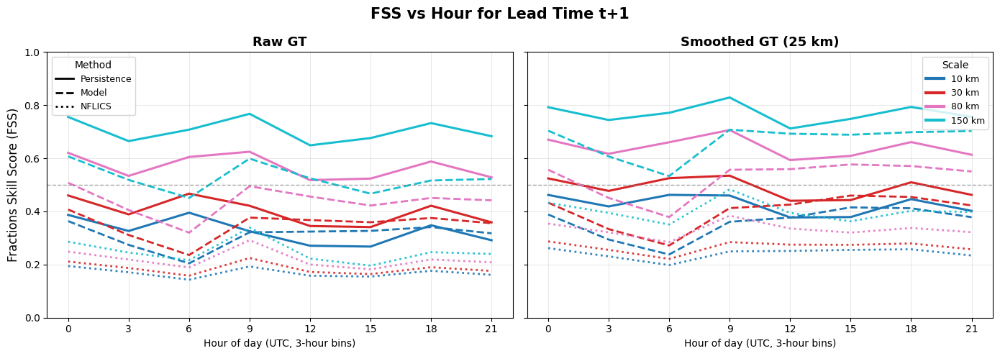

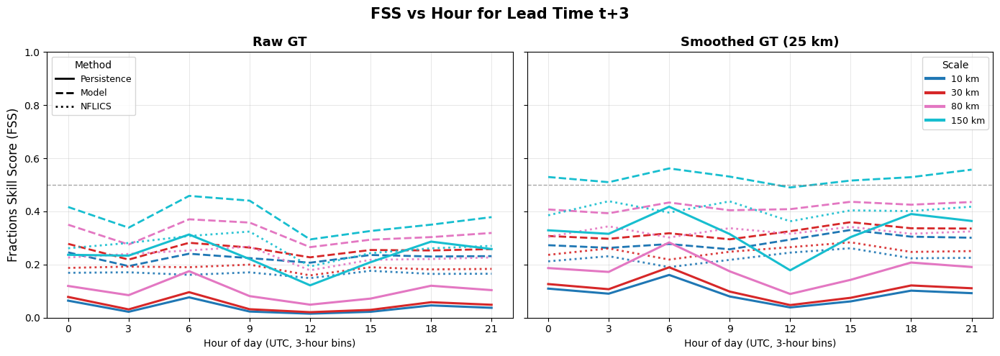

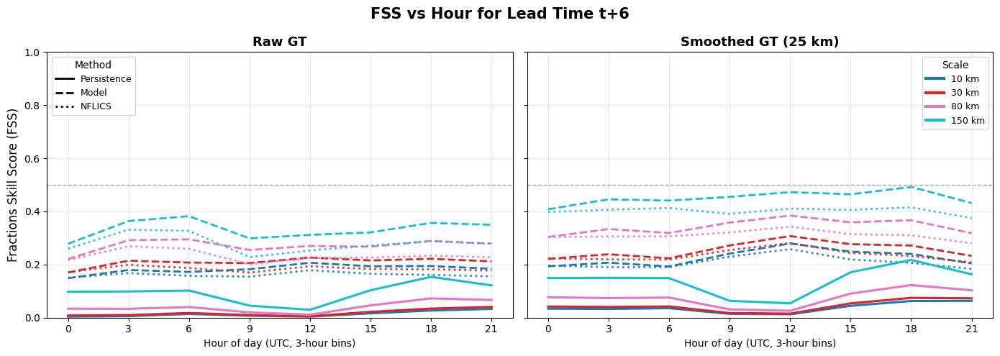

In [4]:
# directory containing the *combined* FSS CSVs
fss_path = "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-nflics-full-corrected/fss"
pattern = r"fss_hour_(\d\d)_t(\d+)\.csv"

files = sorted(os.listdir(fss_path))
all_dfs = []

# load all CSVs and annotate
for fname in files:
    m = re.match(pattern, fname)
    if not m:
        continue

    hour = int(m.group(1))
    lt = int(m.group(2))

    df = pd.read_csv(os.path.join(fss_path, fname))
    df["hour"] = hour
    df["lead_time"] = lt

    all_dfs.append(df)

if not all_dfs:
    raise RuntimeError("No combined FSS CSV files found.")

# combine everything
fss_all = pd.concat(all_dfs, ignore_index=True)

# round nominal scale to nearest 10 km for prettier groupings
fss_all["scale_km"] = (fss_all["nominal_scale_km"] / 10).round() * 10

# restrict to <=150 km like your original code
fss_all = fss_all[fss_all["scale_km"] <= 150]

# bin hours into 3-hour groups
fss_all["hour_bin"] = (fss_all["hour"] // 3) * 3

lead_times = sorted(fss_all["lead_time"].unique())
palette = plt.colormaps.get_cmap("tab10")

# ---------------------------------------------------------
# MAIN LOOP: PLOT PER LEAD TIME
# ---------------------------------------------------------
for lt in lead_times:

    df_lt = fss_all[fss_all["lead_time"] == lt]
    if df_lt.empty:
        print(f"No data for lead time t{lt}")
        continue

    # compute mean FSS per hour_bin and scale
    group_cols = ["hour_bin", "scale_km"]
    df_mean = df_lt.groupby(group_cols, as_index=False).mean().sort_values("hour_bin")

    scales = sorted(df_mean["scale_km"].unique())
    n_scales = len(scales)
    colours = {s: palette(i / max(1, n_scales - 1)) for i, s in enumerate(scales)}

    # ------------------------
    # Create two-panel figure
    # ------------------------
    fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

    panels = [
        ("raw", "Raw GT", axes[0]),
        ("smooth", "Smoothed GT (25 km)", axes[1]),
    ]

    # ------------------------
    # LOOP OVER BOTH PANELS
    # ------------------------
    for ftype, title, ax in panels:

        # choose correct column names
        col_model = f"{ftype}_model"
        col_pers = f"{ftype}_persistence"
        col_nf = f"{ftype}_nflics"

        # plot one line per scale
        for s in scales:
            df_s = df_mean[df_mean["scale_km"] == s]
            colour = colours[s]

            # persistence
            ax.plot(
                df_s["hour_bin"], df_s[col_pers],
                color=colour, linestyle="-", linewidth=2.2,
            )

            # model
            ax.plot(
                df_s["hour_bin"], df_s[col_model],
                color=colour, linestyle="--", linewidth=2.0,
            )

            # NFLICS (optional)
            ax.plot(
                df_s["hour_bin"], df_s[col_nf],
                color=colour, linestyle=":", linewidth=2.0, alpha=0.9,
            )

        ax.axhline(y=0.5, color="grey", linestyle="--", linewidth=1, alpha=0.7)
        ax.set_title(f"{title}", fontsize=13, weight="bold")
        ax.set_xlabel("Hour of day (UTC, 3-hour bins)")
        ax.grid(True, alpha=0.3, linewidth=0.7)
        ax.set_xticks(range(0, 24, 3))
        ax.set_ylim(0, 1)

    axes[0].set_ylabel("Fractions Skill Score (FSS)", fontsize=12)

    # ------------------------
    # LEGENDS
    # ------------------------
    scale_handles = [
        Line2D([], [], color=colours[s], linestyle="-", linewidth=3,
               label=f"{int(s)} km")
        for s in scales
    ]

    method_handles = [
        Line2D([], [], color="black", linestyle="-", linewidth=2, label="Persistence"),
        Line2D([], [], color="black", linestyle="--", linewidth=2, label="Model"),
        Line2D([], [], color="black", linestyle=":", linewidth=2, label="NFLICS"),
    ]

    # scale legend (top right of second panel)
    axes[1].legend(
        handles=scale_handles,
        title="Scale",
        ncol=1,
        loc="upper right",
        fontsize=9,
    )

    # method legend (top left of first panel)
    axes[0].legend(
        handles=method_handles,
        title="Method",
        loc="upper left",
        fontsize=9,
    )

    plt.suptitle(f"FSS vs Hour for Lead Time t+{lt}", fontsize=15, weight="bold")
    plt.tight_layout()
    plt.show()

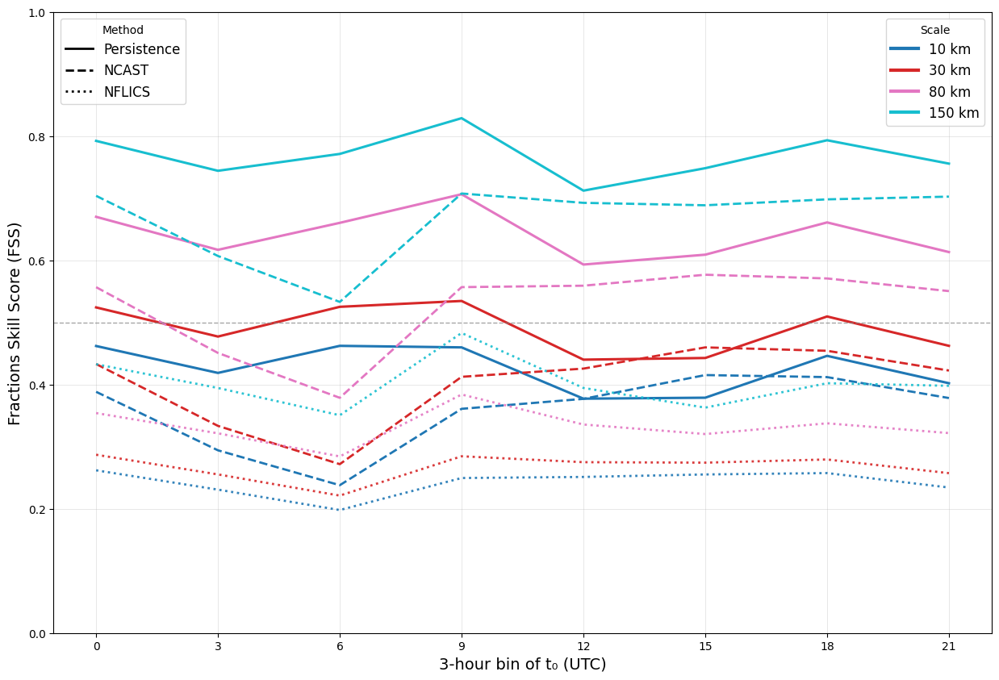

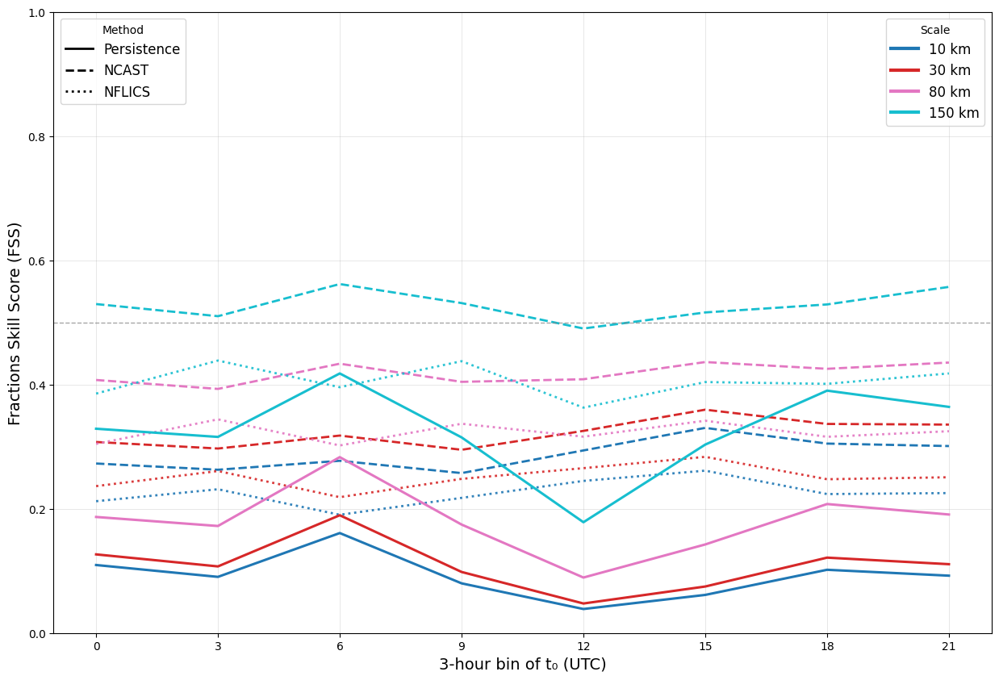

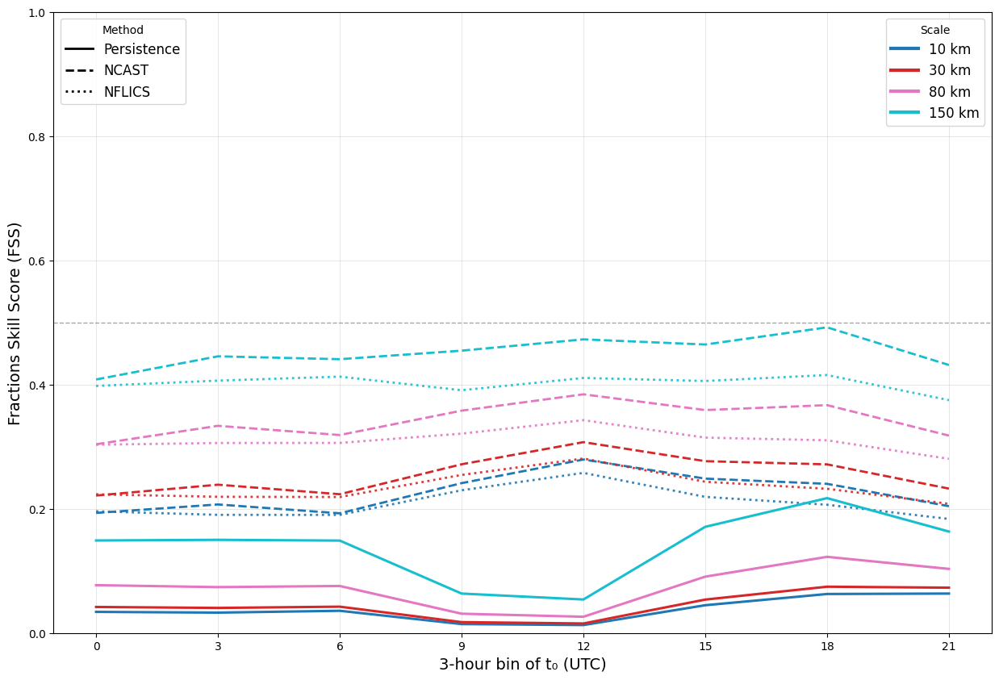

In [34]:
# directory containing the *combined* FSS CSVs
fss_path = "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-nflics-full-corrected/fss"
pattern = r"fss_hour_(\d\d)_t(\d+)\.csv"

files = sorted(os.listdir(fss_path))
all_dfs = []

# load all CSVs and annotate
for fname in files:
    m = re.match(pattern, fname)
    if not m:
        continue

    hour = int(m.group(1))
    lt = int(m.group(2))

    df = pd.read_csv(os.path.join(fss_path, fname))
    df["hour"] = hour
    df["lead_time"] = lt

    all_dfs.append(df)

if not all_dfs:
    raise RuntimeError("No combined FSS CSV files found.")

# combine everything
fss_all = pd.concat(all_dfs, ignore_index=True)

# round nominal scale to nearest 10 km
fss_all["scale_km"] = (fss_all["nominal_scale_km"] / 10).round() * 10

# restrict to <=150 km
fss_all = fss_all[fss_all["scale_km"] <= 150]

# bin hours into 3-hour groups
fss_all["hour_bin"] = (fss_all["hour"] // 3) * 3

lead_times = sorted(fss_all["lead_time"].unique())
palette = plt.colormaps.get_cmap("tab10")

# ---------------------------------------------------------
# MAIN LOOP: PLOT PER LEAD TIME (SMOOTHED ONLY)
# ---------------------------------------------------------
for lt in lead_times:

    df_lt = fss_all[fss_all["lead_time"] == lt]
    if df_lt.empty:
        print(f"No data for lead time t{lt}")
        continue

    group_cols = ["hour_bin", "scale_km"]
    df_mean = df_lt.groupby(group_cols, as_index=False).mean().sort_values("hour_bin")

    scales = sorted(df_mean["scale_km"].unique())
    n_scales = len(scales)
    colours = {s: palette(i / max(1, n_scales - 1)) for i, s in enumerate(scales)}

    fig, ax = plt.subplots(figsize=(15, 10))

    col_model = "smooth_model"
    col_pers = "smooth_persistence"
    col_nf = "smooth_nflics"

    for s in scales:
        df_s = df_mean[df_mean["scale_km"] == s]
        colour = colours[s]

        ax.plot(
            df_s["hour_bin"], df_s[col_pers],
            color=colour, linestyle="-", linewidth=2.2,
        )

        ax.plot(
            df_s["hour_bin"], df_s[col_model],
            color=colour, linestyle="--", linewidth=2.0,
        )

        ax.plot(
            df_s["hour_bin"], df_s[col_nf],
            color=colour, linestyle=":", linewidth=2.0, alpha=0.9,
        )

    ax.axhline(y=0.5, color="grey", linestyle="--", linewidth=1, alpha=0.7)
    ax.set_xlabel("3-hour bin of t₀ (UTC)", fontsize=14)
    ax.set_ylabel("Fractions Skill Score (FSS)", fontsize=14)
    ax.set_xticks(range(0, 24, 3))
    ax.set_ylim(0, 1)
    ax.grid(True, alpha=0.3, linewidth=0.7)

    scale_handles = [
        Line2D([], [], color=colours[s], linestyle="-", linewidth=3,
               label=f"{int(s)} km")
        for s in scales
    ]

    method_handles = [
        Line2D([], [], color="black", linestyle="-", linewidth=2, label="Persistence"),
        Line2D([], [], color="black", linestyle="--", linewidth=2, label="NCAST"),
        Line2D([], [], color="black", linestyle=":", linewidth=2, label="NFLICS"),
    ]
    # method legend on the left
    leg_method = ax.legend(
        handles=method_handles,
        title="Method",
        loc="upper left",
        fontsize=12,
    )
    ax.add_artist(leg_method)

    # scale legend on the right
    ax.legend(
        handles=scale_handles,
        title="Scale",
        loc="upper right",
        fontsize=12,
    )


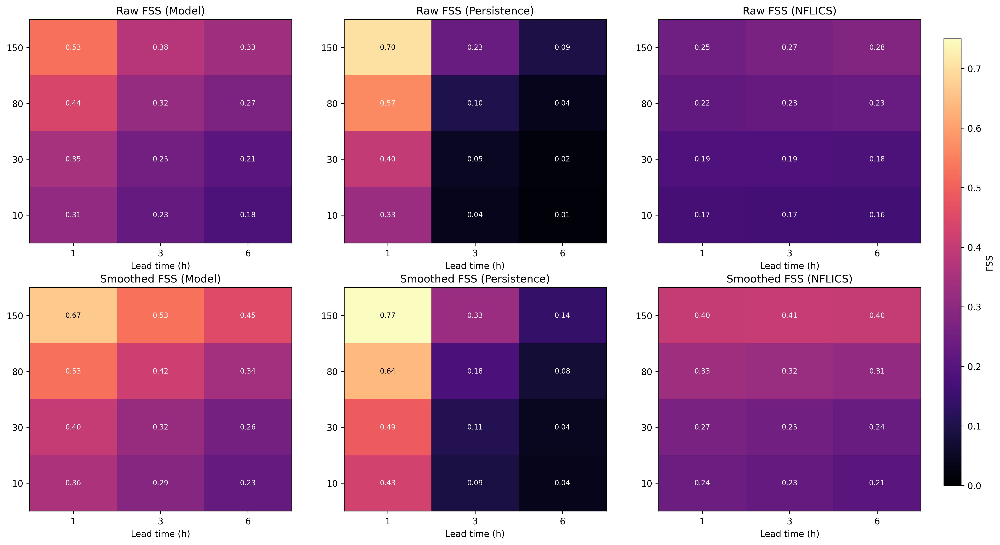

In [5]:
files = sorted(os.listdir(fss_path))
all_dfs = []

# load and annotate
for fname in files:
    m = re.match(pattern, fname)
    if not m:
        continue
    hour = int(m.group(1))
    lt = int(m.group(2))
    df = pd.read_csv(os.path.join(fss_path, fname))
    df["hour"] = hour
    df["lead_time"] = lt
    all_dfs.append(df)

if not all_dfs:
    raise RuntimeError("No FSS CSV files found")

fss_all = pd.concat(all_dfs, ignore_index=True)

# scaling
fss_all["scale_km"] = (fss_all["nominal_scale_km"] / 10).round() * 10
fss_all = fss_all[fss_all["scale_km"] <= 150]

# mean across hours
cols = [
    "raw_model", "raw_persistence", "raw_nflics",
    "smooth_model", "smooth_persistence", "smooth_nflics"
]

df_mean = (
    fss_all
    .groupby(["lead_time", "scale_km"], as_index=False)[cols]
    .mean()
)

# pivots
pivot_raw_model = df_mean.pivot(index="scale_km", columns="lead_time", values="raw_model")
pivot_raw_pers  = df_mean.pivot(index="scale_km", columns="lead_time", values="raw_persistence")
pivot_raw_nf    = df_mean.pivot(index="scale_km", columns="lead_time", values="raw_nflics")

pivot_sm_model  = df_mean.pivot(index="scale_km", columns="lead_time", values="smooth_model")
pivot_sm_pers   = df_mean.pivot(index="scale_km", columns="lead_time", values="smooth_persistence")
pivot_sm_nf     = df_mean.pivot(index="scale_km", columns="lead_time", values="smooth_nflics")

# sort scales
for p in [
    pivot_raw_model, pivot_raw_pers, pivot_raw_nf,
    pivot_sm_model, pivot_sm_pers, pivot_sm_nf
]:
    p.sort_index(ascending=False, inplace=True)
    p.index = p.index.astype(int)

# annotation
def annotate(ax, arr):
    ny, nx = arr.shape
    for i in range(ny):
        for j in range(nx):
            v = arr[i, j]
            if np.isnan(v):
                continue
            ax.text(j, i, f"{v:.2f}",
                    ha="center", va="center",
                    color="white" if v < 0.6 else "black",
                    fontsize=8)

# figure
fig, ax = plt.subplots(2, 3, figsize=(18, 10), dpi=300)

panels = [
    ("Raw FSS (Model)", pivot_raw_model, ax[0, 0]),
    ("Raw FSS (Persistence)", pivot_raw_pers, ax[0, 1]),
    ("Raw FSS (NFLICS)", pivot_raw_nf, ax[0, 2]),
    ("Smoothed FSS (Model)", pivot_sm_model, ax[1, 0]),
    ("Smoothed FSS (Persistence)", pivot_sm_pers, ax[1, 1]),
    ("Smoothed FSS (NFLICS)", pivot_sm_nf, ax[1, 2]),
]

for title, pivot, axis in panels:
    im = axis.imshow(pivot.values, cmap="magma", aspect="auto", vmin=0, vmax=0.75)
    axis.set_title(title)
    axis.set_xlabel("Lead time (h)")
    axis.set_xticks(range(len(pivot.columns)))
    axis.set_xticklabels(pivot.columns)
    axis.set_yticks(range(len(pivot.index)))
    axis.set_yticklabels(pivot.index)
    annotate(axis, pivot.values)

fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax).set_label("FSS")

plt.show()

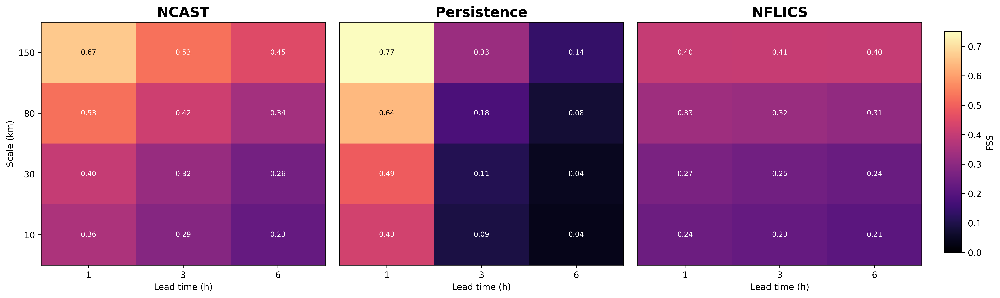

In [6]:
fss_path = "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-nflics-full-corrected/fss"
pattern = r"fss_hour_(\d\d)_t(\d+)\.csv"

files = sorted(os.listdir(fss_path))
all_dfs = []

# load and annotate
for fname in files:
    m = re.match(pattern, fname)
    if not m:
        continue
    hour = int(m.group(1))
    lt = int(m.group(2))
    df = pd.read_csv(os.path.join(fss_path, fname))
    df["hour"] = hour
    df["lead_time"] = lt
    all_dfs.append(df)

if not all_dfs:
    raise RuntimeError("No FSS CSV files found")

fss_all = pd.concat(all_dfs, ignore_index=True)

# scaling
fss_all["scale_km"] = (fss_all["nominal_scale_km"] / 10).round() * 10
fss_all = fss_all[fss_all["scale_km"] <= 150]

# keep only smoothed FSS fields
cols = ["smooth_model", "smooth_persistence", "smooth_nflics"]

df_mean = (
    fss_all
    .groupby(["lead_time", "scale_km"], as_index=False)[cols]
    .mean()
)

# pivots
pivot_sm_model = df_mean.pivot(index="scale_km", columns="lead_time", values="smooth_model")
pivot_sm_pers  = df_mean.pivot(index="scale_km", columns="lead_time", values="smooth_persistence")
pivot_sm_nf    = df_mean.pivot(index="scale_km", columns="lead_time", values="smooth_nflics")

# sort scales
for p in [pivot_sm_model, pivot_sm_pers, pivot_sm_nf]:
    p.sort_index(ascending=False, inplace=True)
    p.index = p.index.astype(int)

# annotation
def annotate(ax, arr):
    ny, nx = arr.shape
    for i in range(ny):
        for j in range(nx):
            v = arr[i, j]
            if np.isnan(v):
                continue
            ax.text(j, i, f"{v:.2f}",
                    ha="center", va="center",
                    color="white" if v < 0.6 else "black",
                    fontsize=8)

# figure: only smoothed panels (1 row, 3 columns)
fig, ax = plt.subplots(1, 3, figsize=(18, 5), dpi=500)
plt.subplots_adjust(wspace=0.05)

panels = [
    ("NCAST",       pivot_sm_model, ax[0]),
    ("Persistence", pivot_sm_pers,  ax[1]),
    ("NFLICS",      pivot_sm_nf,    ax[2]),
]

for idx, (title, pivot, axis) in enumerate(panels):
    im = axis.imshow(pivot.values, cmap="magma", aspect="auto", vmin=0, vmax=0.75)

    # bolder, larger titles
    axis.set_title(title, fontsize=16, fontweight="bold")

    axis.set_xlabel("Lead time (h)")

    # x-axis ticks
    axis.set_xticks(range(len(pivot.columns)))
    axis.set_xticklabels(pivot.columns)

    # y-axis ticks: only leftmost panel
    if idx == 0:
        axis.set_yticks(range(len(pivot.index)))
        axis.set_yticklabels(pivot.index)
        axis.set_ylabel("Scale (km)")
    else:
        axis.set_yticks([])
        axis.set_yticklabels([])

    annotate(axis, pivot.values)

# colourbar
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax).set_label("FSS")

plt.show()


# AUC

In [7]:
auc_dir = f"/work/scratch-nopw2/mendrika/OB/evaluation/ncast-nflics-full-corrected/auc"

In [8]:
hours = [f"{h:02d}" for h in range(24)]

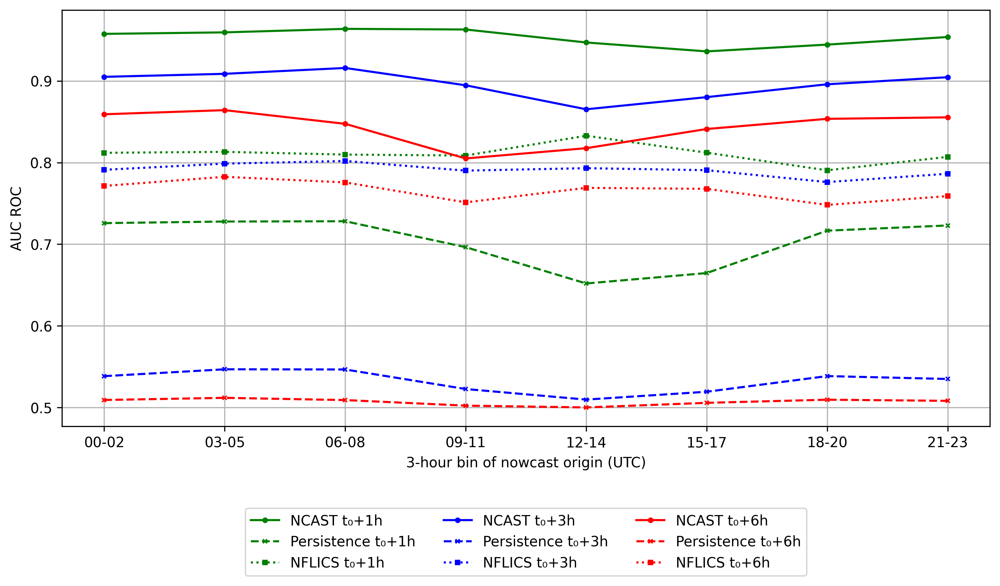

In [9]:
bins = {
    "00-02": ["00", "01", "02"],
    "03-05": ["03", "04", "05"],
    "06-08": ["06", "07", "08"],
    "09-11": ["09", "10", "11"],
    "12-14": ["12", "13", "14"],
    "15-17": ["15", "16", "17"],
    "18-20": ["18", "19", "20"],
    "21-23": ["21", "22", "23"],
}

bin_labels = list(bins.keys())

model_marker = "o"
pers_marker = "x"
nflics_marker = "s"   # square
nflics_linestyle = ":"  # dotted


def load_auc(hour, lead):
    m_path = os.path.join(auc_dir, f"auc_model_hour_{hour}_t{lead}.npy")
    p_path = os.path.join(auc_dir, f"auc_persistence_hour_{hour}_t{lead}.npy")
    n_path = os.path.join(auc_dir, f"auc_nflics_hour_{hour}_t{lead}.npy")

    if os.path.exists(m_path) and os.path.exists(p_path) and os.path.exists(n_path):
        return (
            float(np.load(m_path)),
            float(np.load(p_path)),
            float(np.load(n_path)),
        )
    return np.nan, np.nan, np.nan


auc_model_binned  = {L: [] for L in lead_times}
auc_pers_binned   = {L: [] for L in lead_times}
auc_nflics_binned = {L: [] for L in lead_times}

for L in lead_times:
    for label in bin_labels:
        hours = bins[label]

        vals_m = []
        vals_p = []
        vals_n = []

        for h in hours:
            am, ap, an = load_auc(h, L)
            vals_m.append(am)
            vals_p.append(ap)
            vals_n.append(an)

        auc_model_binned[L].append(np.nanmean(vals_m))
        auc_pers_binned[L].append(np.nanmean(vals_p))
        auc_nflics_binned[L].append(np.nanmean(vals_n))


plt.figure(figsize=(10,6), dpi=300)

# colours for lead times
colours = {
    "1": "green",
    "3": "blue",
    "6": "red",
}

for L in lead_times:
    c = colours[f"{L}"]
    label_suffix = f"t₀+{L}h"

    # model
    plt.plot(
        bin_labels,
        auc_model_binned[L],
        linestyle="-",
        color=c,
        marker=model_marker,
        markersize=3,
        label=f"NCAST {label_suffix}",
    )

    # persistence
    plt.plot(
        bin_labels,
        auc_pers_binned[L],
        linestyle="--",
        color=c,
        marker=pers_marker,
        markersize=3,
        label=f"Persistence {label_suffix}",
    )

    # NFLICS
    plt.plot(
        bin_labels,
        auc_nflics_binned[L],
        linestyle=nflics_linestyle,
        color=c,
        marker=nflics_marker,
        markersize=3,
        label=f"NFLICS {label_suffix}",
    )

plt.xlabel("3-hour bin of nowcast origin (UTC)")
plt.ylabel("AUC ROC")
plt.grid(True)

plt.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, -0.18),
    ncol=3
)

plt.tight_layout()
plt.show()

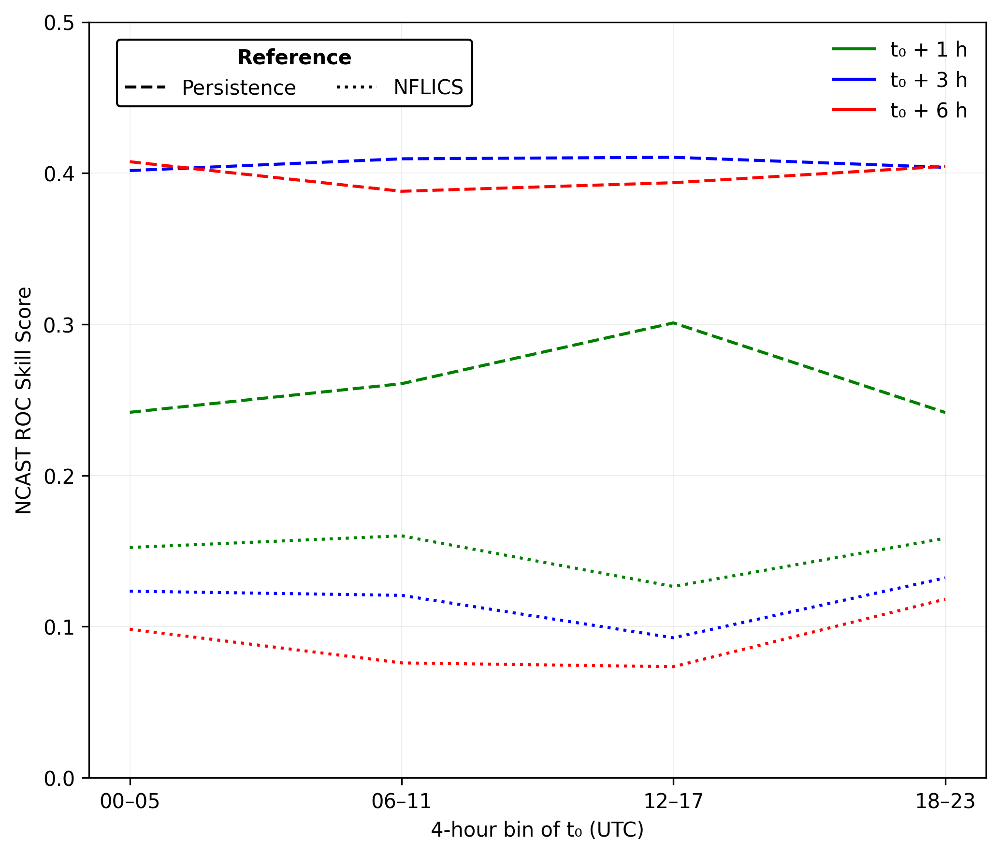

In [ ]:
bins = {
    "00–05": ["00", "01", "02", "03", "04", "05"],
    "06–11": ["06", "07", "08", "09", "10", "11"],
    "12–17": ["12", "13", "14", "15", "16", "17"],
    "18–23": ["18", "19", "20", "21", "22", "23"],
}

bin_labels = list(bins.keys())

nflics_linestyle = ":"
lead_times = ["1", "3", "6"]

colours = {
    "1": "green",
    "3": "blue",
    "6": "red",
}

def load_auc(hour, lead):
    m_path = os.path.join(auc_dir, f"auc_model_hour_{hour}_t{lead}.npy")
    p_path = os.path.join(auc_dir, f"auc_persistence_hour_{hour}_t{lead}.npy")
    n_path = os.path.join(auc_dir, f"auc_nflics_hour_{hour}_t{lead}.npy")

    if os.path.exists(m_path) and os.path.exists(p_path) and os.path.exists(n_path):
        return float(np.load(m_path)), float(np.load(p_path)), float(np.load(n_path))
    return np.nan, np.nan, np.nan

auc_model_binned  = {L: [] for L in lead_times}
auc_pers_binned   = {L: [] for L in lead_times}
auc_nflics_binned = {L: [] for L in lead_times}

for L in lead_times:
    for label in bin_labels:
        hours = bins[label]

        vals_m, vals_p, vals_n = [], [], []
        for h in hours:
            am, ap, an = load_auc(h, L)
            vals_m.append(am)
            vals_p.append(ap)
            vals_n.append(an)

        auc_model_binned[L].append(np.nanmean(vals_m))
        auc_pers_binned[L].append(np.nanmean(vals_p))
        auc_nflics_binned[L].append(np.nanmean(vals_n))

rocss_pers_binned   = {L: [] for L in lead_times}
rocss_nflics_binned = {L: [] for L in lead_times}

for L in lead_times:
    for am, ap, an in zip(
        auc_model_binned[L],
        auc_pers_binned[L],
        auc_nflics_binned[L],
    ):
        if np.isnan(am) or am == 0:
            rocss_pers_binned[L].append(np.nan)
            rocss_nflics_binned[L].append(np.nan)
            continue

        r_p = 1 - ap / am if not np.isnan(ap) else np.nan
        r_n = 1 - an / am if not np.isnan(an) else np.nan

        rocss_pers_binned[L].append(r_p)
        rocss_nflics_binned[L].append(r_n)

plt.figure(figsize=(7, 6), dpi=300)

for L in lead_times:
    c = colours[L]

    plt.plot(
        bin_labels,
        rocss_pers_binned[L],
        linestyle="--",
        color=c,
    )

    plt.plot(
        bin_labels,
        rocss_nflics_binned[L],
        linestyle=nflics_linestyle,
        color=c,
    )

plt.axhline(0, color="black", linewidth=0.5)

plt.xlabel("6-hour bin of t₀ (UTC)")
plt.ylabel("NCAST ROC Skill Score")
plt.grid(True, linewidth=0.1)

colour_handles = [
    Line2D([0], [0], color="green", linestyle="-", label="t₀ + 1 h"),
    Line2D([0], [0], color="blue",  linestyle="-", label="t₀ + 3 h"),
    Line2D([0], [0], color="red",   linestyle="-", label="t₀ + 6 h"),
]

first_legend = plt.legend(
    handles=colour_handles,
    loc="upper right",
    frameon=False,
)
plt.gca().add_artist(first_legend)

style_handles = [
    Line2D([0], [0], color="black", linestyle="--", label="Persistence"),
    Line2D([0], [0], color="black", linestyle=":",  label="NFLICS"),
]

leg = plt.legend(
    handles=style_handles,
    title="Reference",
    loc="upper left",
    bbox_to_anchor=(0.02, 0.99),
    frameon=True,
    framealpha=1.0,
    edgecolor="black",
    ncols=2
)

leg.get_title().set_fontweight("bold")

plt.ylim(0, 0.5)
plt.tight_layout()
plt.show()

# BSS

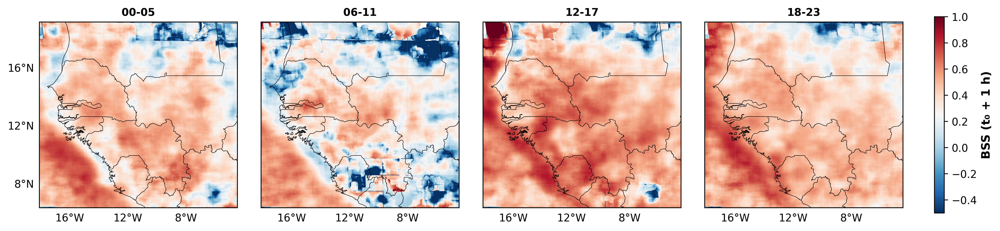

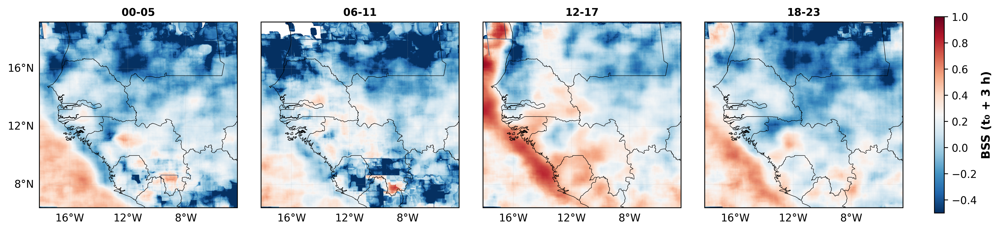

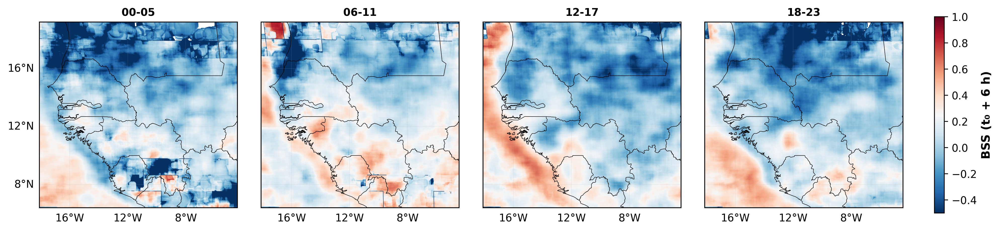

In [11]:
bss_dir = "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-nflics-full-corrected/bss"

bins = {
    "00-05": ["00", "01", "02", "03", "04", "05"],
    "06-11": ["06", "07", "08", "09", "10", "11"],
    "12-17": ["12", "13", "14", "15", "16", "17"],
    "18-23": ["18", "19", "20", "21", "22", "23"],
}

def load_bss(hour, lead):
    path = os.path.join(bss_dir, f"bss_pixelwise_hour_{hour}_t{lead}.npy")
    if os.path.exists(path):
        return np.load(path)
    return None

for lead_time in ["1", "3", "6"]:
# compute bin means
    bss_bin_maps = {}
    for label, hours in bins.items():
        maps = [load_bss(h, lead_time) for h in hours]
        maps = [m for m in maps if m is not None]
        if maps:
            bss_bin_maps[label] = np.nanmean(np.stack(maps), axis=0)
        else:
            bss_bin_maps[label] = None

    # longitudes & latitudes for the grid (matching your 512x512 Africa domain)
    lat_min, lat_max = 6.4, 19.2
    lon_min, lon_max = -18.1, -4.45

    # cartopy setup
    fig, axes = plt.subplots(
        1, 4,
        figsize=(18, 4.5),
        subplot_kw={'projection': ccrs.PlateCarree()},
        dpi=300
    )

    plt.subplots_adjust(wspace=0.12)

    # symmetric colour scale
    vmax = 1.0
    vmin = -0.5
    cmap = "RdBu_r"

    x_ticks = np.arange(-20, 0, 4)
    y_ticks = np.arange(4, 22, 4)

    shapename = "admin_0_countries"
    countries_shp = shpreader.natural_earth("10m", "cultural", shapename)

    for i, (label, hours) in enumerate(bins.items()):
        bss_map = bss_bin_maps[label]
        ax = axes[i]
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())

        ax.add_feature(cfeature.LAND, edgecolor="black", facecolor="none", linewidth=0.4)
        ax.add_feature(cfeature.COASTLINE, edgecolor="black", linewidth=0.4)
        ax.add_feature(cfeature.BORDERS, edgecolor="black", linewidth=0.4)

        if bss_map is not None:
            masked = np.ma.masked_invalid(bss_map)
            im = ax.pcolormesh(
                lons, lats, masked,
                transform=ccrs.PlateCarree(),
                cmap=cmap,
                shading="gouraud",
                vmin=vmin,
                vmax=vmax
            )
        else:
            im = None

        gl = ax.gridlines(draw_labels=True, alpha=1, linestyle="--", linewidth=0.1)
        gl.top_labels = False
        gl.right_labels = False
        gl.bottom_labels = True
        gl.left_labels = (i == 0)
        gl.xlocator = mticker.FixedLocator(x_ticks)
        gl.ylocator = mticker.FixedLocator(y_ticks)

        ax.set_title(f"{label}", fontsize=10, fontweight="bold")

    # colourbar
    cbar = fig.colorbar(
        im, ax=axes.ravel().tolist(),
        shrink=0.75, pad=0.03
            )
    
    cbar.set_label(
        f"BSS (t₀ + {lead_time} h)",
        fontsize=11,
        fontweight="bold"
    )

    plt.show()

In [12]:
from sklearn import metrics

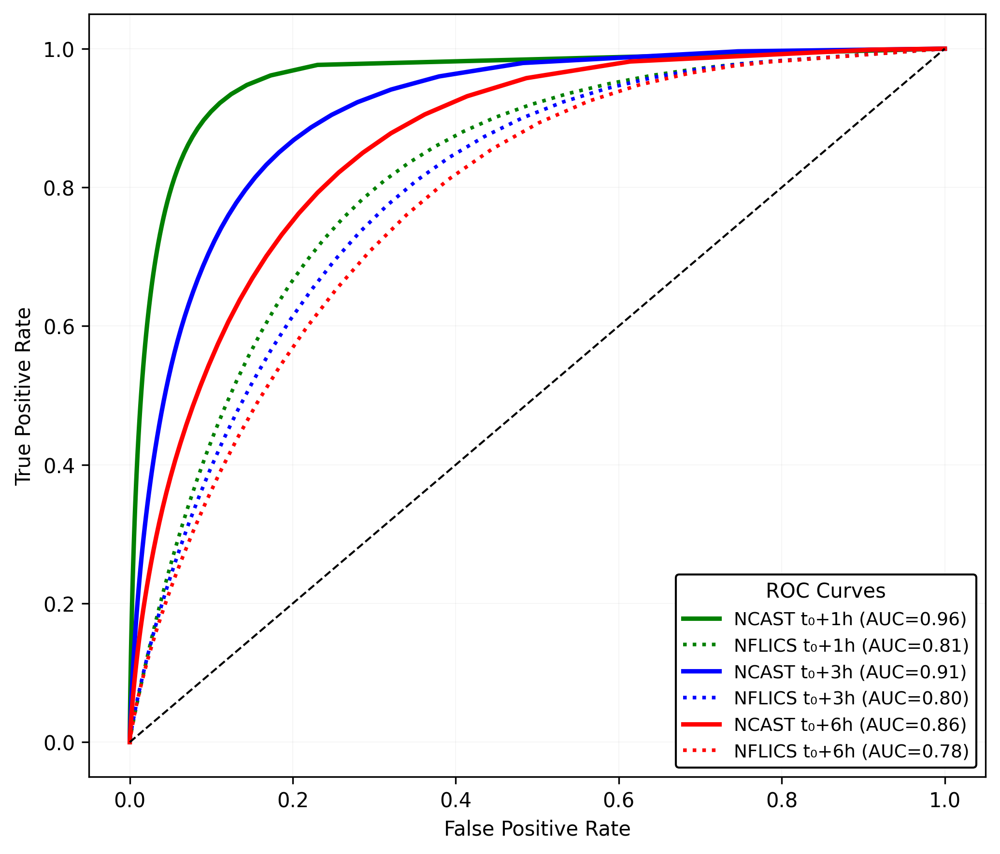

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics

# directories
roc_dir_ncast = "/home/users/mendrika/Object-Based-LSTMConv/outputs/evaluation/ncast-calibrated/roc"
roc_dir_bench = "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-nflics-full-corrected/roc"

lead_times = ["1", "3", "6"]

colours = {"1": "green", "3": "blue", "6": "red"}

plt.figure(figsize=(7, 6), dpi=300)

for lt in lead_times:

    # ------------------ NCAST ------------------
    fpr_m = np.load(os.path.join(roc_dir_ncast, f"roc_fpr_model_t{lt}.npy"))
    tpr_m = np.load(os.path.join(roc_dir_ncast, f"roc_tpr_model_t{lt}.npy"))
    auc_m = metrics.auc(fpr_m, tpr_m)

    # ------------------ Persistence ------------------
    fpr_p = np.load(os.path.join(roc_dir_bench, f"roc_fpr_persistence_t{lt}.npy"))
    tpr_p = np.load(os.path.join(roc_dir_bench, f"roc_tpr_persistence_t{lt}.npy"))
    auc_p = metrics.auc(fpr_p, tpr_p)

    # ------------------ NFLICS ------------------
    fpr_n = np.load(os.path.join(roc_dir_bench, f"roc_fpr_nflics_t{lt}.npy"))
    tpr_n = np.load(os.path.join(roc_dir_bench, f"roc_tpr_nflics_t{lt}.npy"))
    auc_n = metrics.auc(fpr_n, tpr_n)

    # ------------------ Plot curves ------------------

    # NCAST (solid)
    plt.plot(
        fpr_m, tpr_m,
        color=colours[lt], linewidth=2.2,
        label=f"NCAST t₀+{lt}h (AUC={auc_m:.2f})"
    )

    # NFLICS (dotted)
    plt.plot(
        fpr_n, tpr_n,
        color=colours[lt], linestyle=":", linewidth=1.8,
        label=f"NFLICS t₀+{lt}h (AUC={auc_n:.2f})"
    )

# reference line
plt.plot([0, 1], [0, 1], color="black", linestyle="--", linewidth=1)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.grid(True, linewidth=0.1, alpha=0.6)

plt.legend(
    title="ROC Curves",
    loc="lower right",
    frameon=True,
    framealpha=1.0,
    edgecolor="black",
    fontsize=9,
    title_fontsize=10
)

plt.tight_layout()
plt.show()


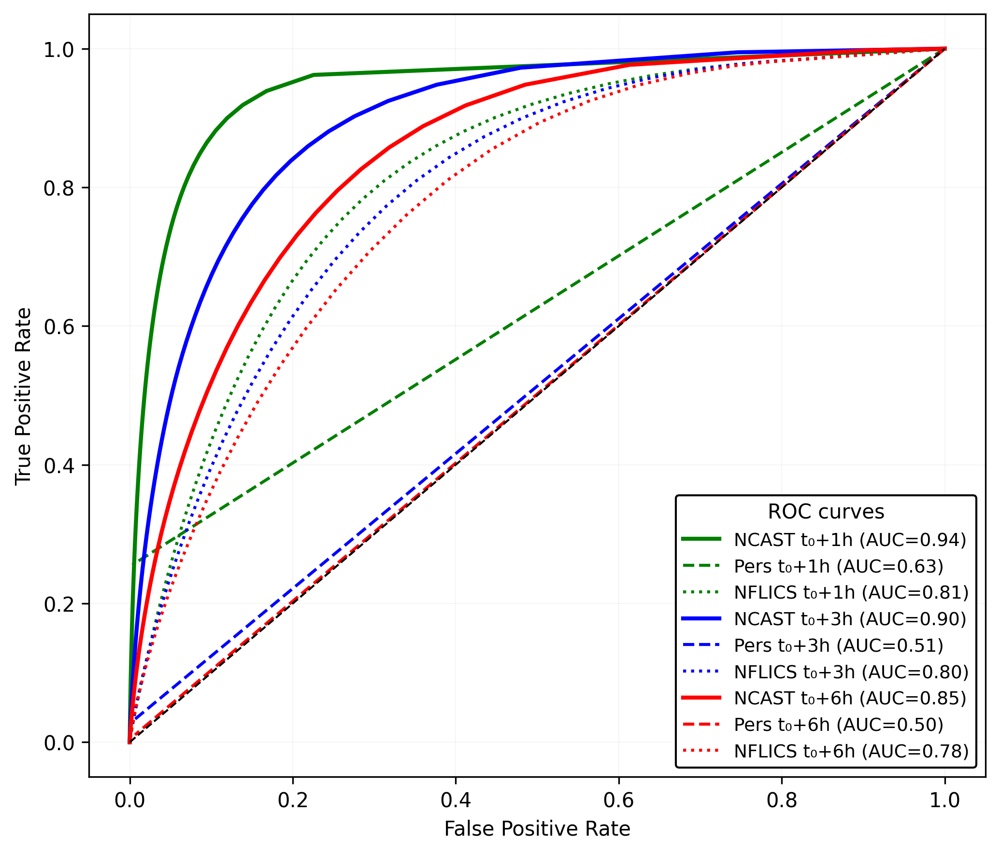

In [14]:
roc_dir = "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-nflics-full-corrected/roc"

lead_times = ["1", "3", "6"]

colours_model = {"1": "green", "3": "blue", "6": "red"}
colours_pers  = {"1": "green", "3": "blue", "6": "red"}
colours_nfl   = {"1": "green", "3": "blue", "6": "red"}

plt.figure(figsize=(7, 6), dpi=300)

for lt in lead_times:

    # model
    fpr_m = np.load(os.path.join(roc_dir, f"roc_fpr_model_t{lt}.npy"))
    tpr_m = np.load(os.path.join(roc_dir, f"roc_tpr_model_t{lt}.npy"))
    auc_m = metrics.auc(fpr_m, tpr_m)

    # persistence
    fpr_p = np.load(os.path.join(roc_dir, f"roc_fpr_persistence_t{lt}.npy"))
    tpr_p = np.load(os.path.join(roc_dir, f"roc_tpr_persistence_t{lt}.npy"))
    auc_p = metrics.auc(fpr_p, tpr_p)

    # nfl
    fpr_n = np.load(os.path.join(roc_dir, f"roc_fpr_nflics_t{lt}.npy"))
    tpr_n = np.load(os.path.join(roc_dir, f"roc_tpr_nflics_t{lt}.npy"))
    auc_n = metrics.auc(fpr_n, tpr_n)

    # ------------------ plot ------------------

    # model
    plt.plot(
        fpr_m, tpr_m,
        color=colours_model[lt], linewidth=2.0,
        label=f"NCAST t₀+{lt}h (AUC={auc_m:.2f})"
    )

    # persistence (dashed)
    plt.plot(
        fpr_p, tpr_p,
        color=colours_pers[lt], linestyle="--", linewidth=1.5,
        label=f"Pers t₀+{lt}h (AUC={auc_p:.2f})"
    )

    # nfl (dotted)
    plt.plot(
        fpr_n, tpr_n,
        color=colours_nfl[lt], linestyle=":", linewidth=1.5,
        label=f"NFLICS t₀+{lt}h (AUC={auc_n:.2f})"
    )

# 1:1 reference line
plt.plot([0, 1], [0, 1], color="black", linestyle="--", linewidth=1)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.grid(True, linewidth=0.1, alpha=0.6)

plt.legend(
    title="ROC curves",
    loc="lower right",
    frameon=True,
    framealpha=1.0,
    edgecolor="black",
    fontsize=9,
    title_fontsize=10
)

plt.tight_layout()
plt.show()


In [ ]:
paths = {
    "NCAST t₀+1 h": "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-calibrated/reliability/rel_t1.csv",
    "NCAST t₀+3 h": "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-calibrated/reliability/rel_t3.csv",
    "NCAST t₀+6 h": "/work/scratch-nopw2/mendrika/OB/evaluation/ncast-calibrated/reliability/rel_t6.csv",
}

colours = {
    "NCAST t₀+1 h": "tab:green",
    "NCAST t₀+3 h": "tab:blue",
    "NCAST t₀+6 h": "tab:red",
}

MIN_SAMPLES = 100
SCALE = 0.7   # reduce histogram height

plt.figure(figsize=(7, 6))

for label, path in paths.items():

    df = pd.read_csv(path)

    bin_left   = df["bin_left"].values
    bin_right  = df["bin_right"].values
    bin_centres = df["bin_centre"].values
    obs = df["obs_cal"].values
    counts = df["counts_cal"].values

    edges = np.r_[bin_left, bin_right[-1]]

    sharp = counts / counts.max() if counts.max() > 0 else counts
    sharp_scaled = sharp * SCALE

    plt.step(
        edges,
        np.r_[sharp_scaled, sharp_scaled[-1]],
        where="post",
        linestyle="--",
        linewidth=1.2,
        color=colours[label],
        alpha=0.9,
    )

    mask = counts >= MIN_SAMPLES

    plt.plot(
        bin_centres[mask],
        obs[mask],
        "-",
        linewidth=2,
        color=colours[label],
        label=label,
    )

plt.plot([0, 1], [0, 1], "--", color="grey", linewidth=1)

plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel("Predicted probability")
plt.ylabel("Observed frequency")
plt.grid(alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()